In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns


# Link to Data

https://data.cityofnewyork.us/Public-Safety/NYPD-Shooting-Incident-Data-Historic-/833y-fsy8

List of every shooting incident that occurred in NYC going back to 2006 through the end of the previous calendar year.

This is a breakdown of every shooting incident that occurred in NYC going back to 2006 through the end of the previous calendar year. This data is manually extracted every quarter and reviewed by the Office of Management Analysis and Planning before being posted on the NYPD website. Each record represents a shooting incident in NYC and includes information about the event, the location and time of occurrence. In addition, information related to suspect and victim demographics is also included. This data can be used by the public to explore the nature of shooting/criminal activity

`
Field Name
Description
INCIDENT_KEY
Randomly generated persistent ID for each incident
OCCUR_DATE
Exact date of the shooting incident
OCCUR_TIME
Exact time of the shooting incident
BORO
Borough where the shooting incident occurred
PRECINCT
Precinct where the shooting incident occurred
JURISDICTION_CODE
Jurisdiction where the shooting incident occurred. Jurisdiction codes 0(Patrol), 1(Transit) and 2(Housing) represent NYPD whilst codes 3 and more represent non NYPD jurisdictions
LOCATION_DESC
Location of the shooting incident
STATISTICAL_MURDER_FLAG
Shooting resulted in the victim’s death which would be counted as a murder
PERP_AGE_GROUP
Perpetrator’s age within a category
PERP_SEX
Perpetrator’s sex description
PERP_RACE
Perpetrator’s race description
VIC_AGE_GROUP
Victim’s age within a category
VIC_SEX
Victim’s sex description
VIC_RACE
Victim’s race description
X_COORD_CD
Midblock X-coordinate for New York State Plane Coordinate System, Long Island Zone, NAD 83, units feet (FIPS 3104)
Y_COORD_CD
Midblock Y-coordinate for New York State Plane Coordinate System, Long Island Zone, NAD 83, units feet (FIPS 3104)
Latitude
Latitude coordinate for Global Coordinate System, WGS 1984, decimal degrees (EPSG 4326)
Longitude
Longitude coordinate for Global Coordinate System, WGS 1984, decimal degrees (EPSG 4326)
`

In [3]:
df = pd.read_csv('NYPD_Shooting_Incident_Data__Historic_.csv')

In [4]:
df.head()

,INCIDENT_KEY,OCCUR_DATE,OCCUR_TIME,BORO,PRECINCT,JURISDICTION_CODE,LOCATION_DESC,STATISTICAL_MURDER_FLAG,PERP_AGE_GROUP,PERP_SEX,PERP_RACE,VIC_AGE_GROUP,VIC_SEX,VIC_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude
0,169180023,09/09/2017,3:57:00,STATEN ISLAND,120,0.0,NaN,False,NaN,NaN,NaN,25-44,M,BLACK,959975,171772,40.638126,-74.087467
1,169180027,09/09/2017,22:15:00,BRONX,50,0.0,NaN,False,NaN,NaN,NaN,25-44,M,BLACK HISPANIC,1011288,255912,40.869061,-73.902242
2,169180025,09/09/2017,18:35:00,BROOKLYN,79,2.0,MULTI DWELL - PUBLIC HOUS,False,NaN,NaN,NaN,18-24,M,BLACK,999888,193014,40.696450,-73.943607
3,169180024,09/09/2017,15:20:00,BROOKLYN,67,0.0,NaN,False,18-24,M,BLACK,18-24,M,BLACK,997784,172132,40.639137,-73.951236
4,169180022,09/09/2017,0:20:00,BROOKLYN,61,2.0,MULTI DWELL - PUBLIC HOUS,False,NaN,NaN,NaN,25-44,M,ASIAN / PACIFIC ISLANDER,1001019,156467,40.596134,-73.939619


In [5]:
df.shape

(21408, 18)

In [6]:
df.drop_duplicates(inplace = True) 

In [7]:
df.columns

Index(['INCIDENT_KEY', 'OCCUR_DATE', 'OCCUR_TIME', 'BORO', 'PRECINCT',
       'JURISDICTION_CODE', 'LOCATION_DESC', 'STATISTICAL_MURDER_FLAG',
       'PERP_AGE_GROUP', 'PERP_SEX', 'PERP_RACE', 'VIC_AGE_GROUP', 'VIC_SEX',
       'VIC_RACE', 'X_COORD_CD', 'Y_COORD_CD', 'Latitude', 'Longitude'],
      dtype='object')

In [8]:
df.count()

INCIDENT_KEY               21408
OCCUR_DATE                 21408
OCCUR_TIME                 21408
BORO                       21408
PRECINCT                   21408
JURISDICTION_CODE          21406
LOCATION_DESC               9189
STATISTICAL_MURDER_FLAG    21408
PERP_AGE_GROUP             14190
PERP_SEX                   14224
PERP_RACE                  14224
VIC_AGE_GROUP              21408
VIC_SEX                    21408
VIC_RACE                   21408
X_COORD_CD                 21408
Y_COORD_CD                 21408
Latitude                   21408
Longitude                  21408
dtype: int64

In [9]:
#Dont like names so I will change them for easy of use theres no space but in case and lowercase letters
df.columns = [i.replace(' ','_').lower() for i in df.columns]

In [10]:
df.describe()

,incident_key,precinct,jurisdiction_code,latitude,longitude
count,2.140800e+04,21408.000000,21406.000000,21408.000000,21408.000000
mean,9.086174e+07,66.240377,0.326778,40.735809,-73.909238
std,5.154002e+07,27.075786,0.737971,0.087312,0.066795
min,9.953245e+06,1.000000,0.000000,40.511586,-74.249304
25%,5.143890e+07,44.000000,0.000000,40.667910,-73.943353
50%,8.022698e+07,69.000000,0.000000,40.697583,-73.915508
75%,1.402865e+08,81.000000,0.000000,40.823118,-73.882072
max,2.030838e+08,123.000000,2.000000,40.910819,-73.703082


# Nulls?

In [11]:
df.isnull().any()

incident_key               False
occur_date                 False
occur_time                 False
boro                       False
precinct                   False
jurisdiction_code           True
location_desc               True
statistical_murder_flag    False
perp_age_group              True
perp_sex                    True
perp_race                   True
vic_age_group              False
vic_sex                    False
vic_race                   False
x_coord_cd                 False
y_coord_cd                 False
latitude                   False
longitude                  False
dtype: bool

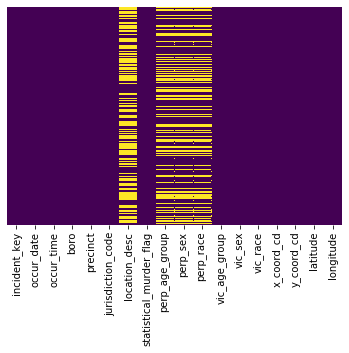

In [12]:
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis')


## Cases in each Boro

In [13]:
df['boro'].value_counts() 

BROOKLYN         8829
BRONX            6128
QUEENS           3198
MANHATTAN        2617
STATEN ISLAND     636
Name: boro, dtype: int64

# Correlation? 

In [14]:
df.corr()

,incident_key,precinct,jurisdiction_code,statistical_murder_flag,latitude,longitude
incident_key,1.000000,0.002315,0.039830,-0.012727,0.009150,-0.004471
precinct,0.002315,1.000000,-0.062289,0.015979,-0.650968,0.176927
jurisdiction_code,0.039830,-0.062289,1.000000,-0.041672,-0.022335,-0.086428
statistical_murder_flag,-0.012727,0.015979,-0.041672,1.000000,-0.010875,0.002594
latitude,0.009150,-0.650968,-0.022335,-0.010875,1.000000,0.149765
longitude,-0.004471,0.176927,-0.086428,0.002594,0.149765,1.000000


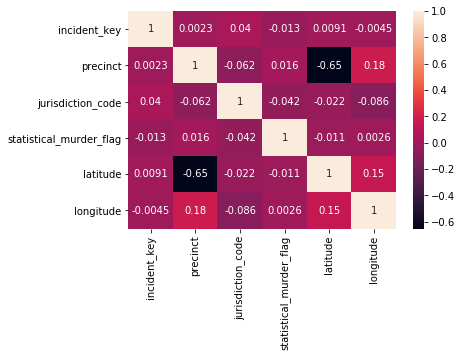

In [15]:
sns.heatmap(df.corr(), annot=True)

# Male vs Female Victims 

In [16]:
# Can see that majority male commit shootings based on data set.
print(df['vic_sex'].value_counts(normalize=True) * 100)
print(df.vic_sex.value_counts())
print(f"Total cases {df.incident_key.count()}")

M    90.732436
F     9.211510
U     0.056054
Name: vic_sex, dtype: float64
M    19424
F     1972
U       12
Name: vic_sex, dtype: int64
Total cases 21408


# Male vs Female Perpetrator

In [17]:
#Seem to having lot missing data from here

In [18]:
print(f"We have {df['perp_sex'].count()} out of {len(df)}")

We have 14224 out of 21408


In [19]:
missing = df['perp_sex'].isna().sum()
print(missing)
print(df['perp_sex'].isnull().sum())
print(f"Missing {(missing/df['incident_key'].count()) * 100:.2f}% Sex")

7184
7184
Missing 33.56% Sex


In [20]:

print(df['perp_sex'].value_counts(normalize=True) * 100)
print(df['perp_sex'].value_counts())
print(f"Total cases {df['perp_sex'].count()}")

M    87.338301
U    10.552587
F     2.109111
Name: perp_sex, dtype: float64
M    12423
U     1501
F      300
Name: perp_sex, dtype: int64
Total cases 14224


# How far are stations from shootings?

In [21]:
df

,incident_key,occur_date,occur_time,boro,precinct,jurisdiction_code,location_desc,statistical_murder_flag,perp_age_group,perp_sex,perp_race,vic_age_group,vic_sex,vic_race,x_coord_cd,y_coord_cd,latitude,longitude
0,169180023,09/09/2017,3:57:00,STATEN ISLAND,120,0.0,NaN,False,NaN,NaN,NaN,25-44,M,BLACK,959975,171772,40.638126,-74.087467
1,169180027,09/09/2017,22:15:00,BRONX,50,0.0,NaN,False,NaN,NaN,NaN,25-44,M,BLACK HISPANIC,1011288,255912,40.869061,-73.902242
2,169180025,09/09/2017,18:35:00,BROOKLYN,79,2.0,MULTI DWELL - PUBLIC HOUS,False,NaN,NaN,NaN,18-24,M,BLACK,999888,193014,40.696450,-73.943607
3,169180024,09/09/2017,15:20:00,BROOKLYN,67,0.0,NaN,False,18-24,M,BLACK,18-24,M,BLACK,997784,172132,40.639137,-73.951236
4,169180022,09/09/2017,0:20:00,BROOKLYN,61,2.0,MULTI DWELL - PUBLIC HOUS,False,NaN,NaN,NaN,25-44,M,ASIAN / PACIFIC ISLANDER,1001019,156467,40.596134,-73.939619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21403,191851037,01/03/2019,21:00:00,BRONX,49,0.0,NaN,False,NaN,NaN,NaN,25-44,M,BLACK,"1,024,472","256,716",40.871217,-73.854569
21404,191790873,01/02/2019,13:34:00,BROOKLYN,79,2.0,MULTI DWELL - PUBLIC HOUS,False,NaN,NaN,NaN,25-44,M,WHITE HISPANIC,"999,653","193,642",40.698174,-73.944453
21405,191739125,01/01/2019,05:40:00,BROOKLYN,88,2.0,MULTI DWELL - PUBLIC HOUS,False,NaN,NaN,NaN,18-24,M,BLACK,"991,148","192,533",40.695141,-73.975126
21406,191709964,01/01/2019,04:26:00,BROOKLYN,75,2.0,MULTI DWELL - PUBLIC HOUS,True,NaN,NaN,NaN,25-44,M,BLACK,"1,021,382","181,825",40.665675,-73.866156


In [22]:
df['statistical_murder_flag'] = df['statistical_murder_flag'].apply(lambda x : 1 if x is True else 0)

In [23]:
#df = pd.get_dummies(df, columns=['boro'], drop_first=True)

In [24]:
df['boro'].unique()

array(['STATEN ISLAND', 'BRONX', 'BROOKLYN', 'MANHATTAN', 'QUEENS'],
      dtype=object)

In [25]:
df['boro'].value_counts()

BROOKLYN         8829
BRONX            6128
QUEENS           3198
MANHATTAN        2617
STATEN ISLAND     636
Name: boro, dtype: int64

In [26]:
df = df.drop(['vic_age_group','vic_age_group','vic_age_group','jurisdiction_code','x_coord_cd','y_coord_cd'],axis=1)

In [27]:
df.groupby('boro').sum()

,incident_key,precinct,statistical_murder_flag,latitude,longitude
boro,,,,,
BRONX,562666226741,275615,1147,250293.425532,-452801.197512
BROOKLYN,790963310622,656468,1717,359035.629519,-652743.025241
MANHATTAN,237157075824,66543,457,106778.436823,-193529.147554
QUEENS,294503315513,342879,636,130127.754081,-236038.787187
STATEN ISLAND,59878181894,76569,124,25836.950032,-47136.805764


In [28]:
test = df.groupby('boro').count()

In [29]:
df['statistical_murder_flag'].value_counts()

0    17327
1     4081
Name: statistical_murder_flag, dtype: int64

# Murder vs Categories Plots

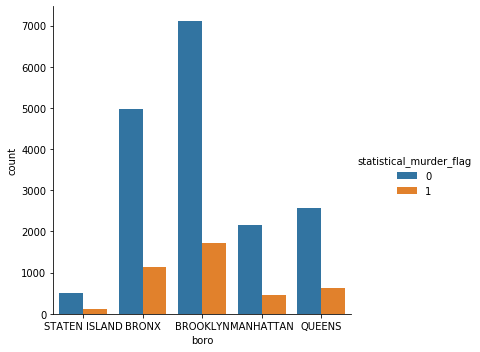

In [30]:
sns.catplot('boro',kind='count',hue='statistical_murder_flag',data=df)

In [31]:
values = df.groupby('boro').count()['incident_key'].values.tolist()
names = df.groupby('boro').count()['incident_key'].index.tolist()

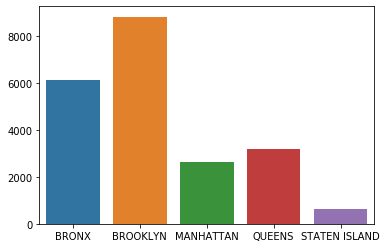

In [32]:
sns.barplot(x=names,y=values)

In [33]:
df['occur_time'] = pd.to_datetime(df['occur_time'])

In [34]:
df['occur_time'] = df['occur_time'].dt.hour

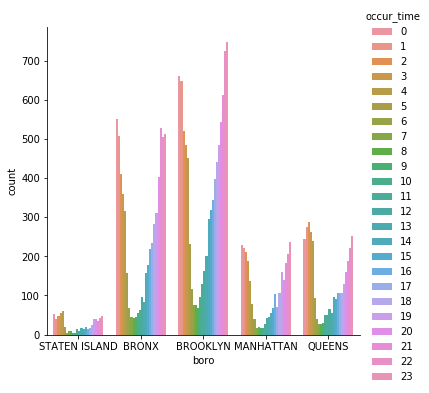

In [35]:
sns.catplot('boro',kind='count',hue='occur_time',data=df)

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21408 entries, 0 to 21407
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   incident_key             21408 non-null  int64  
 1   occur_date               21408 non-null  object 
 2   occur_time               21408 non-null  int64  
 3   boro                     21408 non-null  object 
 4   precinct                 21408 non-null  int64  
 5   location_desc            9189 non-null   object 
 6   statistical_murder_flag  21408 non-null  int64  
 7   perp_age_group           14190 non-null  object 
 8   perp_sex                 14224 non-null  object 
 9   perp_race                14224 non-null  object 
 10  vic_sex                  21408 non-null  object 
 11  vic_race                 21408 non-null  object 
 12  latitude                 21408 non-null  float64
 13  longitude                21408 non-null  float64
dtypes: float64(2), int64(4

In [37]:
# import libraries
import geopandas as gpd
from shapely.geometry import Point, Polygon
geometry = [Point(xy) for xy in zip(df['longitude'], df['latitude'])]

gdf = gpd.GeoDataFrame(
    df, geometry=geometry)

In [38]:
gdf.head()

,incident_key,occur_date,occur_time,boro,precinct,location_desc,statistical_murder_flag,perp_age_group,perp_sex,perp_race,vic_sex,vic_race,latitude,longitude,geometry
0,169180023,09/09/2017,3,STATEN ISLAND,120,NaN,0,NaN,NaN,NaN,M,BLACK,40.638126,-74.087467,POINT (-74.08747 40.63813)
1,169180027,09/09/2017,22,BRONX,50,NaN,0,NaN,NaN,NaN,M,BLACK HISPANIC,40.869061,-73.902242,POINT (-73.90224 40.86906)
2,169180025,09/09/2017,18,BROOKLYN,79,MULTI DWELL - PUBLIC HOUS,0,NaN,NaN,NaN,M,BLACK,40.696450,-73.943607,POINT (-73.94361 40.69645)
3,169180024,09/09/2017,15,BROOKLYN,67,NaN,0,18-24,M,BLACK,M,BLACK,40.639137,-73.951236,POINT (-73.95124 40.63914)
4,169180022,09/09/2017,0,BROOKLYN,61,MULTI DWELL - PUBLIC HOUS,0,NaN,NaN,NaN,M,ASIAN / PACIFIC ISLANDER,40.596134,-73.939619,POINT (-73.93962 40.59613)


In [39]:
# import street map
street_map = gpd.read_file('geo_export_d0d351da-f9d7-4899-b24b-ad0204044b9c.shp')

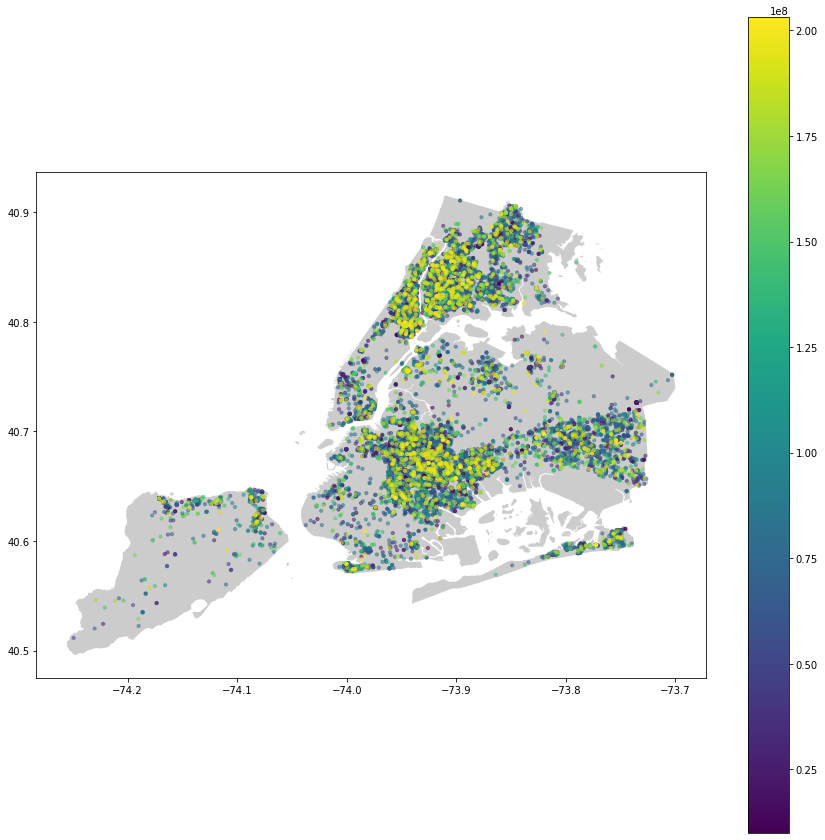

In [40]:
# create figure and axes, assign to subplot
fig, ax = plt.subplots(figsize=(15,15))
# add .shp mapfile to axes
street_map.plot(ax=ax, alpha=0.4,color='grey')
gdf.plot(column='incident_key',ax=ax,alpha=0.5, legend=True,markersize=10)

In [41]:
import folium
folium_map = folium.Map(location=[40.738, -73.98],
                        zoom_start=13,
                        tiles="CartoDB dark_matter")
marker = folium.CircleMarker(location=[20.738, -73.98])
marker.add_to(folium_map)

In [42]:
for i in range(len(df)):
    folium.CircleMarker(location=[df['latitude'][i],df["longitude"][i]],radius=.2,fill=True).add_to(folium_map)

In [43]:
folium_map.save("my_map.html")

In [44]:
folium_map

In [54]:
(df['precinct'] == 100).sum()

126

In [62]:
(df['precinct'] == 100 & (df['statistical_murder_flag'] is False)).sum()

0

In [69]:
precint_100df = df.loc[df['precinct'] == 100]

In [71]:
precint_100df.describe()

,incident_key,occur_time,precinct,statistical_murder_flag,latitude,longitude
count,1.260000e+02,126.000000,126.0,126.000000,126.000000,126.000000
mean,8.905997e+07,11.579365,100.0,0.063492,40.590449,-73.807377
std,4.591928e+07,9.227223,0.0,0.244819,0.009324,0.011940
min,1.673377e+07,0.000000,100.0,0.000000,40.569363,-73.864106
25%,5.179794e+07,2.000000,100.0,0.000000,40.587664,-73.811705
50%,8.539326e+07,14.000000,100.0,0.000000,40.589894,-73.808328
75%,1.380844e+08,21.000000,100.0,0.000000,40.592857,-73.799081
max,1.976607e+08,23.000000,100.0,1.000000,40.684011,-73.788633


In [76]:
precint_100df.count()

incident_key               126
occur_date                 126
occur_time                 126
boro                       126
precinct                   126
location_desc               66
statistical_murder_flag    126
perp_age_group              90
perp_sex                    90
perp_race                   90
vic_sex                    126
vic_race                   126
latitude                   126
longitude                  126
geometry                   126
dtype: int64

In [78]:
precint_100df['statistical_murder_flag'].value_counts()

0    118
1      8
Name: statistical_murder_flag, dtype: int64

In [79]:
precint_100df

,incident_key,occur_date,occur_time,boro,precinct,location_desc,statistical_murder_flag,perp_age_group,perp_sex,perp_race,vic_sex,vic_race,latitude,longitude,geometry
209,145924878,09/06/2015,0,QUEENS,100,MULTI DWELL - PUBLIC HOUS,0,25-44,M,BLACK,M,BLACK,40.587880,-73.808575,POINT (-73.80858 40.58788)
427,24157457,09/04/2006,22,QUEENS,100,NaN,0,18-24,M,BLACK,M,BLACK,40.586466,-73.816522,POINT (-73.81652 40.58647)
908,34627192,09/25/2007,19,QUEENS,100,NaN,0,18-24,M,BLACK,M,WHITE HISPANIC,40.587401,-73.812606,POINT (-73.81261 40.58740)
1033,138833196,09/22/2014,20,QUEENS,100,NaN,0,NaN,NaN,NaN,F,WHITE,40.592886,-73.795653,POINT (-73.79565 40.59289)
1209,51559653,09/20/2008,22,QUEENS,100,MULTI DWELL - PUBLIC HOUS,0,UNKNOWN,U,UNKNOWN,M,BLACK,40.587880,-73.808575,POINT (-73.80858 40.58788)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18735,71032457,01/30/2010,0,QUEENS,100,MULTI DWELL - APT BUILD,0,UNKNOWN,M,BLACK,M,BLACK,40.595978,-73.796421,POINT (-73.79642 40.59598)
19111,140618709,01/20/2015,8,QUEENS,100,NaN,1,25-44,M,BLACK,M,BLACK,40.588009,-73.807286,POINT (-73.80729 40.58801)
20391,179691037,05/02/2018,23,QUEENS,100,NaN,0,NaN,NaN,NaN,M,BLACK,40.597686,-73.796599,POINT (-73.79660 40.59769)
20458,178115696,04/12/2018,22,QUEENS,100,NaN,0,18-24,M,BLACK,M,ASIAN / PACIFIC ISLANDER,40.591440,-73.789586,POINT (-73.78959 40.59144)


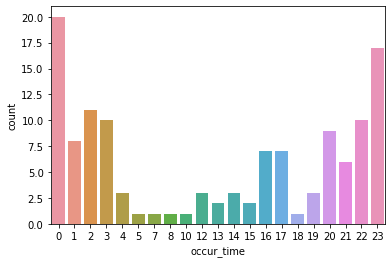

In [88]:
sns.countplot(x='occur_time',data=precint_100df)

incident_key                                                     11221555819
occur_date                 09/06/201509/04/200609/25/200709/22/201409/20/...
occur_time                                                              1459
boro                       QUEENSQUEENSQUEENSQUEENSQUEENSQUEENSQUEENSQUEE...
precinct                                                               12600
statistical_murder_flag                                                    8
vic_sex                    MMMFMMMMMMMMMMMMMMMMMMMMMMMFMMMMMMMMMMMMMMMFMM...
vic_race                   BLACKBLACKWHITE HISPANICWHITEBLACKBLACKBLACKBL...
latitude                                                              5114.4
longitude                                                           -9299.73
dtype: object